# TeamDetector relabel flow

Notebook para inspeccionar visualmente el flujo `YOLO -> homografía -> TeamDetector` sobre `video_prueba_medio` y entender por qué ciertas detecciones salen de `player` hacia `referee` o `goalkeeper`.

In [1]:
from pathlib import Path

import pandas as pd
from IPython.display import display

from team_detector_relabel_flow_utils import (
    analyze_team_detector_video,
    build_distance_margin_plot,
    build_bootstrap_reference_figures,
    build_field_relabel_map,
    build_lab_scatter_3d,
    build_relabel_timeline,
    load_artifacts,
    show_frame_overlay,
)

PROJECT_ROOT = Path.cwd()
CONFIG_PATH = "../../config.yaml"
VIDEO_KEY = "video_prueba_medio"
MODEL_PATH = PROJECT_ROOT / "../../models/finetuning/yolov11m/weights/best.pt"
OUTPUT_DIR = PROJECT_ROOT / "../../output/analysis/team_detector_video_prueba_medio_best"
MAX_FRAMES = None  # usa 200 si quieres una pasada rápida
FRAME_STEP = 1
TEAM_COLORS = None  # déjalo en None para arrancar sin referencias iniciales

In [2]:
artifacts = analyze_team_detector_video(
    config_path=CONFIG_PATH,
    video_key=VIDEO_KEY,
    model_path=MODEL_PATH,
    output_dir=OUTPUT_DIR,
    max_frames=MAX_FRAMES,
    frame_step=FRAME_STEP,
    team_colors=TEAM_COLORS,
    verbose=True,
)
artifacts


0: 384x640 1 ball, 26 players, 4 referees, 91.2ms
Speed: 6.4ms preprocess, 91.2ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 640)
Procesados 1 frames...

0: 384x640 1 ball, 27 players, 4 referees, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 24 players, 3 referees, 8.3ms
Speed: 1.7ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 27 players, 4 referees, 8.2ms
Speed: 1.7ms preprocess, 8.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 balls, 25 players, 4 referees, 8.0ms
Speed: 1.7ms preprocess, 8.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 ball, 24 players, 2 referees, 8.1ms
Speed: 2.0ms preprocess, 8.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 balls, 23 players, 3 referees, 8.3ms
Speed: 1.6ms preprocess, 8.3ms inference, 1.0m

RelabelAnalysisArtifacts(output_dir=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_prueba_medio_best'), detections_csv=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_prueba_medio_best/detections.csv'), frames_jsonl=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_prueba_medio_best/frames.jsonl'), summary_json=PosixPath('/home/hegarc04/narrador-futbol/experiments/visualization/../../output/analysis/team_detector_video_prueba_medio_best/summary.json'))

In [3]:
detections_df, frames_df, summary = load_artifacts(OUTPUT_DIR)
display(pd.Series(summary))
display(detections_df.head())
display(frames_df.head())

video_path                  /home/hegarc04/narrador-futbol/data/partidoPru...
model_path                  /home/hegarc04/narrador-futbol/experiments/vis...
frames_processed                                                          200
detections_total                                                         5413
relabelled_total                                                          274
relabelled_to_referee                                                      82
relabelled_to_goalkeeper                                                  120
bootstrap_min_samples                           {'player': 60, 'referee': 15}
bootstrap_samples_used                          {'player': 65, 'referee': 18}
bootstrap_samples_json      /home/hegarc04/narrador-futbol/experiments/vis...
output_dir                  /home/hegarc04/narrador-futbol/experiments/vis...
dtype: object

,frame_idx,det_idx,bbox_x1,bbox_y1,bbox_x2,bbox_y2,bbox_w,bbox_h,confidence,class_yolo,...,ref_referee_b,upper_bound_Equipo 1,median_dist_Equipo 1,iqr_dist_Equipo 1,upper_bound_Equipo 2,median_dist_Equipo 2,iqr_dist_Equipo 2,upper_bound_referee,median_dist_referee,iqr_dist_referee
0,0,0,329.993835,492.322693,364.886902,569.656189,34.893066,77.333496,0.868959,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,1,1310.173096,444.693054,1352.015991,517.102112,41.842896,72.409058,0.867199,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,2,1229.379883,429.819580,1264.796387,501.763275,35.416504,71.943695,0.857884,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,3,534.124329,686.315002,577.325867,784.877014,43.201538,98.562012,0.853255,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,4,358.785004,720.084717,393.260803,826.009094,34.475800,105.924377,0.851774,player,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,frame_idx,num_detections,homography_quality_status,homography_quality_score,field_positions_usable_for_tracking,team_colors,outfield_team_distance_stats,referee_distance_stats,updated
0,0,31,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"
1,1,31,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"
2,2,28,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"
3,3,31,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"
4,4,28,None,None,True,"{'Equipo 1': None, 'Equipo 2': None, 'referee'...",{},None,"{'player': False, 'referee': False}"


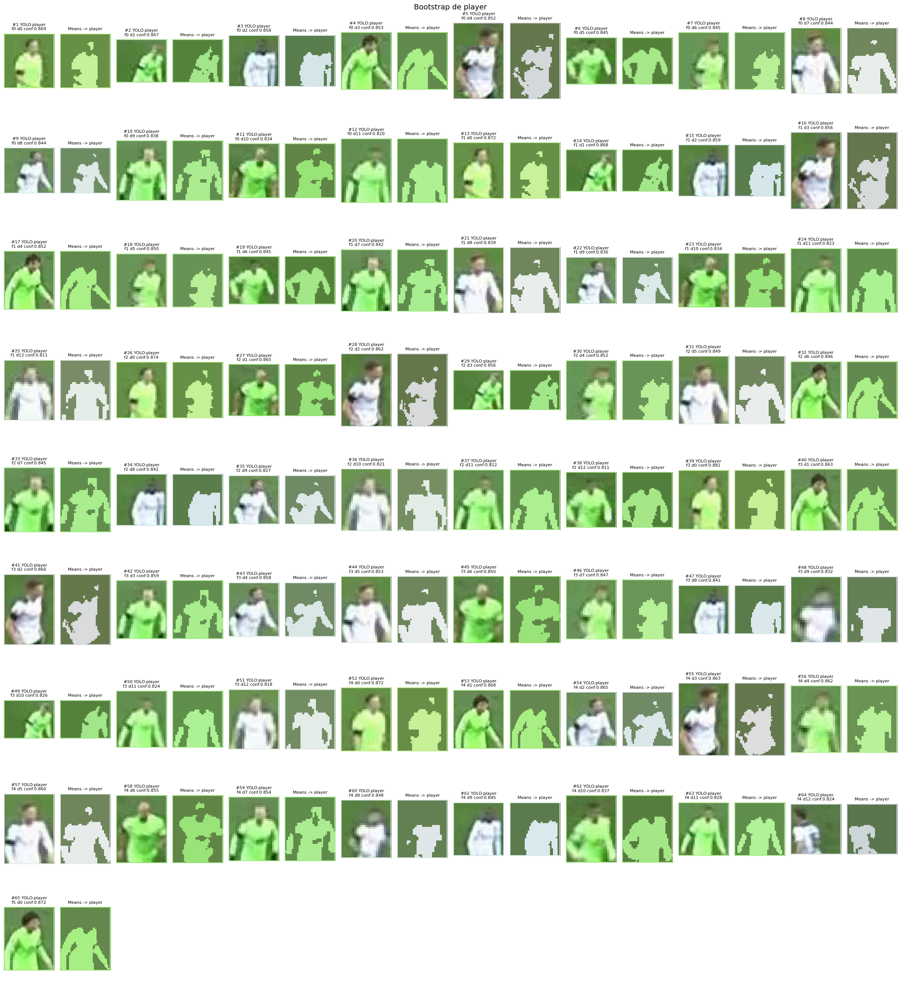

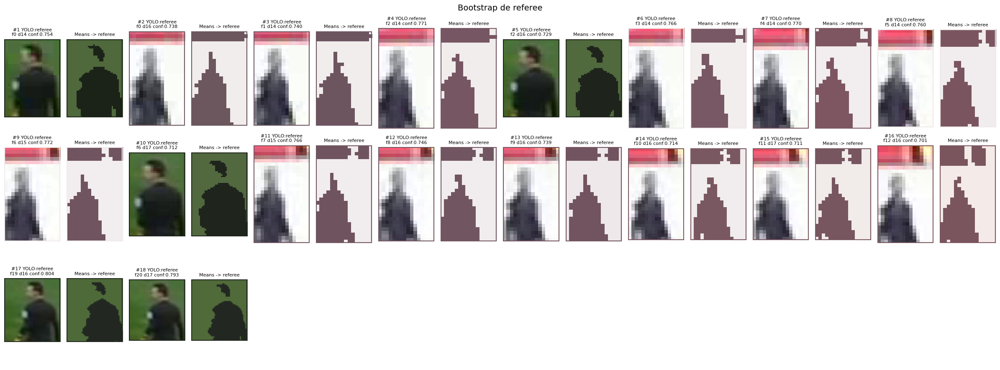

In [4]:
fig_bootstrap_player, fig_bootstrap_referee = build_bootstrap_reference_figures(OUTPUT_DIR, n_cols=8)


## Resumen rápido

- `distance_margin > 0`: la detección cae fuera del `upper_bound` del equipo más cercano.
- `new_possible_class`: decisión de `_check_possible_new_class`.
- `class_final`: salida final de `_reassign_class`.
- Los marcadores en rombo indican relabel.

In [5]:
summary_table = pd.DataFrame(
    {
        "detecciones": [len(detections_df)],
        "relabel_total": [int(detections_df['relabelled'].sum())],
        "player/ref -> referee": [int(detections_df['relabeled_to_referee'].sum())],
        "player/ref -> goalkeeper": [int(detections_df['relabeled_to_goalkeeper'].sum())],
        "frames": [int(detections_df['frame_idx'].nunique())],
    }
)
display(summary_table)

display(
    detections_df[
        [
            'class_yolo', 'class_final', 'new_possible_class', 'reason_path', 'team_final'
        ]
    ]
    .value_counts(dropna=False)
    .rename('count')
    .reset_index()
    .head(20)
)

,detecciones,relabel_total,player/ref -> referee,player/ref -> goalkeeper,frames
0,5413,274,82,120,200


,class_yolo,class_final,new_possible_class,reason_path,team_final,count
0,player,player,player,new_possible:player|reassign:player|reason:rel...,Equipo 1,2044
1,player,player,player,new_possible:player|reassign:player|reason:rel...,Equipo 2,1874
2,ball,ball,NaN,non_candidate_class,NaN,218
3,referee,referee,NaN,kept_class|reason:referee_cluster_outlier_fall...,Equipo 2,208
4,player,player,player,new_possible:player|reassign:player|reason:kee...,Equipo 2,182
5,player,player,NaN,kept_class|reason:keep_current_class,NaN,129
6,referee,referee,referee,new_possible:referee|reassign:referee|reason:r...,NaN,101
7,player,player,player,new_possible:player|reassign:player|reason:kee...,Equipo 1,93
8,player,referee,referee,new_possible:referee|reassign:referee|reason:r...,NaN,82
9,player,player,NaN,kept_class|reason:keep_current_class,Equipo 2,67


In [6]:
fig_lab = build_lab_scatter_3d(detections_df, only_relabelled=False, include_spheres=True)
fig_lab.show()

In [7]:
fig_lab_relabel = build_lab_scatter_3d(
    detections_df,
    only_relabelled=True,
    include_spheres=True,
    title='Solo detecciones relabeleadas en LAB',
)
fig_lab_relabel.show()

In [8]:
fig_field = build_field_relabel_map(detections_df)
fig_field.show()

In [9]:
fig_timeline = build_relabel_timeline(detections_df)
fig_timeline.show()

fig_margin = build_distance_margin_plot(detections_df)
fig_margin.show()

In [10]:
relabel_cases = detections_df[detections_df['relabelled']].copy()
interesting = relabel_cases[
    [
        'frame_idx', 'det_idx', 'class_yolo', 'class_final', 'new_possible_class', 'reason_path',
        'field_x_m', 'field_y_m',
        'distance_before_equipo_1', 'distance_before_equipo_2',
        'upper_bound_Equipo 1', 'upper_bound_Equipo 2',
        'can_be_ref', 'can_be_goalkeeper'
    ]
].sort_values(['frame_idx', 'det_idx'])
display(interesting.head(50))

,frame_idx,det_idx,class_yolo,class_final,new_possible_class,reason_path,field_x_m,field_y_m,distance_before_equipo_1,distance_before_equipo_2,upper_bound_Equipo 1,upper_bound_Equipo 2,can_be_ref,can_be_goalkeeper
168,5,19,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,93.780251,36.487228,61.551765,57.059479,15.903107,11.948758,False,True
196,6,21,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,93.791115,36.457722,106.527283,120.127426,15.903107,11.948758,False,True
225,7,20,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,93.742432,36.552040,52.877045,55.747219,15.903107,11.948758,False,True
254,8,22,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,93.795357,36.485394,106.311378,120.110603,15.903107,11.948758,False,True
283,9,23,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,93.850807,36.381771,106.691689,120.510513,15.903107,11.948758,False,True
314,10,23,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,93.827377,36.412807,106.049202,120.008904,13.741717,12.454305,False,True
347,11,28,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,93.885704,36.280777,49.882042,54.864685,13.741717,12.454305,False,True
376,12,25,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,93.761894,36.540653,52.725567,55.668541,13.741717,12.454305,False,True
444,15,8,player,goalkeeper,goalkeeper,new_possible:goalkeeper|reassign:goalkeeper|re...,50.694626,60.538216,55.417561,17.954891,15.493911,16.934698,False,True
649,21,29,referee,player,player,new_possible:player|reassign:player|reason:rel...,49.868423,0.723374,60.249126,9.400866,15.567309,18.684816,True,False


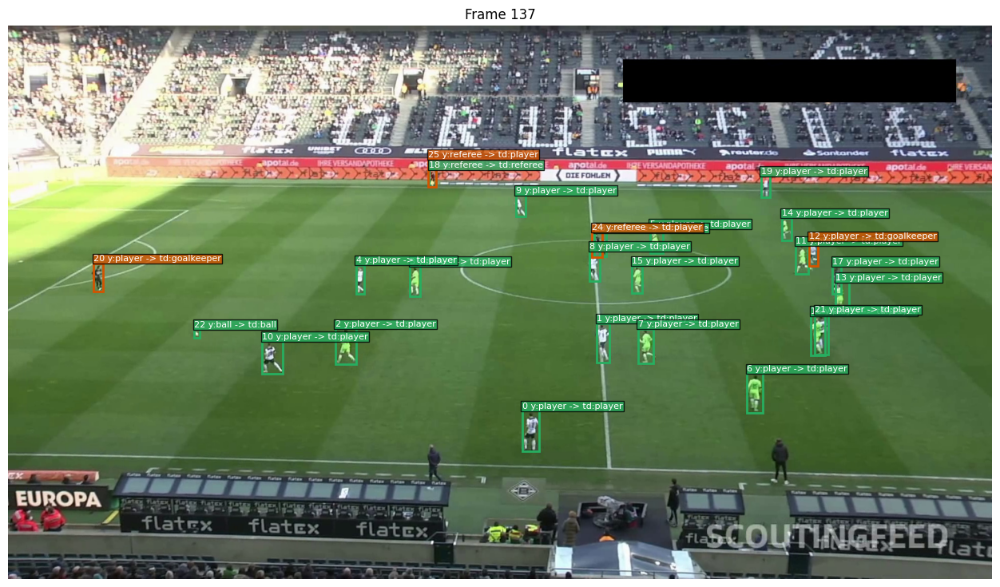

In [11]:
FRAME_TO_INSPECT = int(relabel_cases['frame_idx'].mode().iloc[0]) if not relabel_cases.empty else 0
fig = show_frame_overlay(detections_df, '../../data/partidoPrueba/partido_medio.mp4', FRAME_TO_INSPECT)

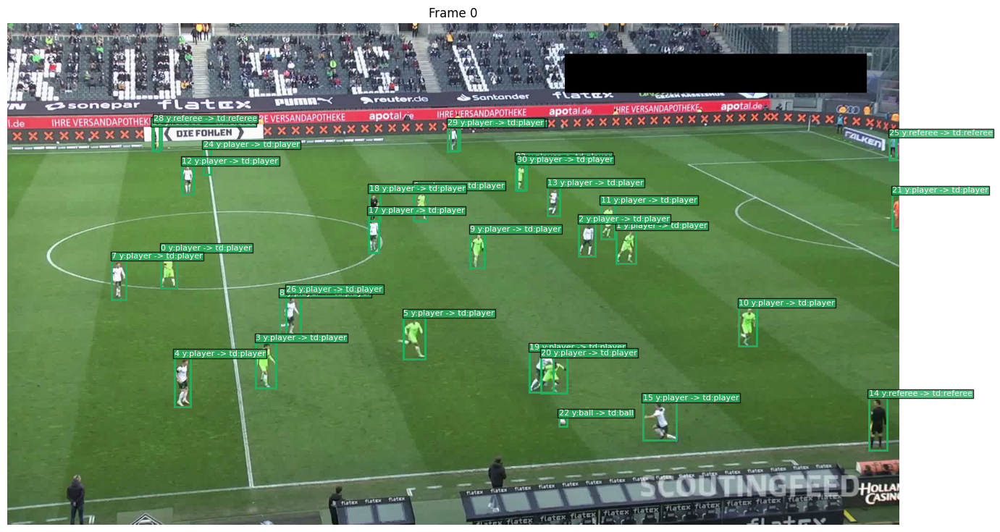

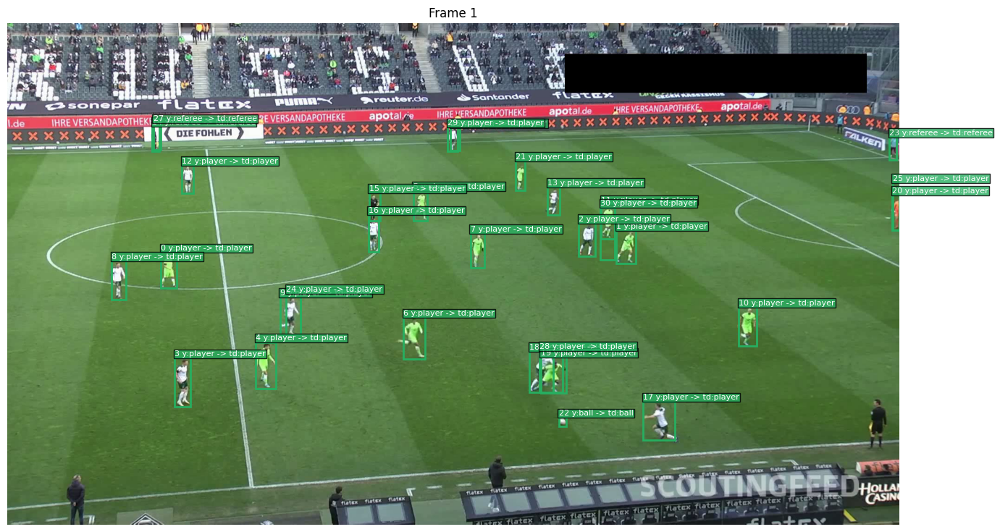

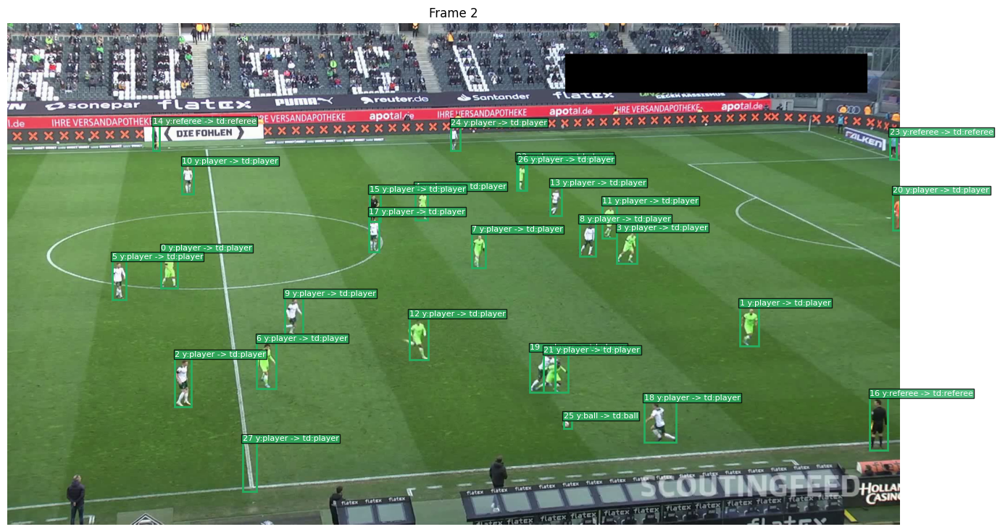

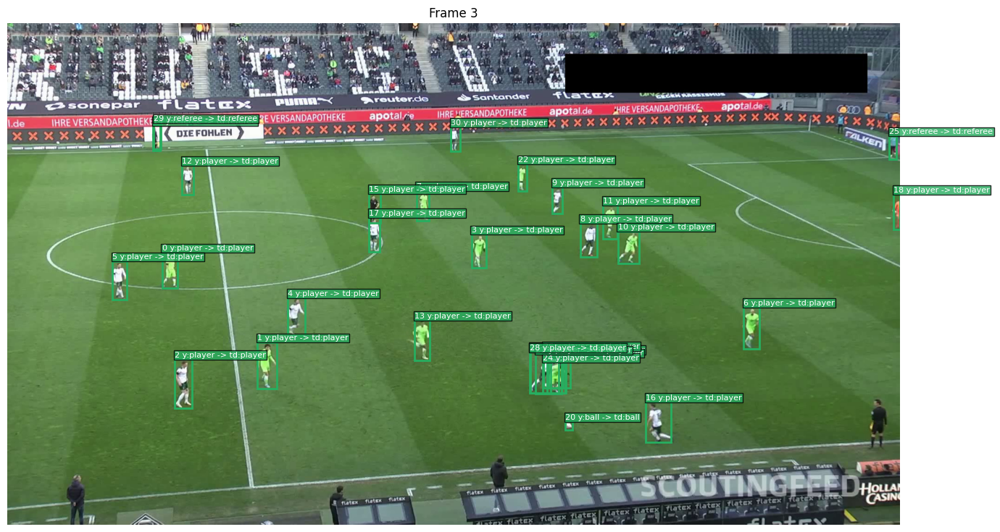

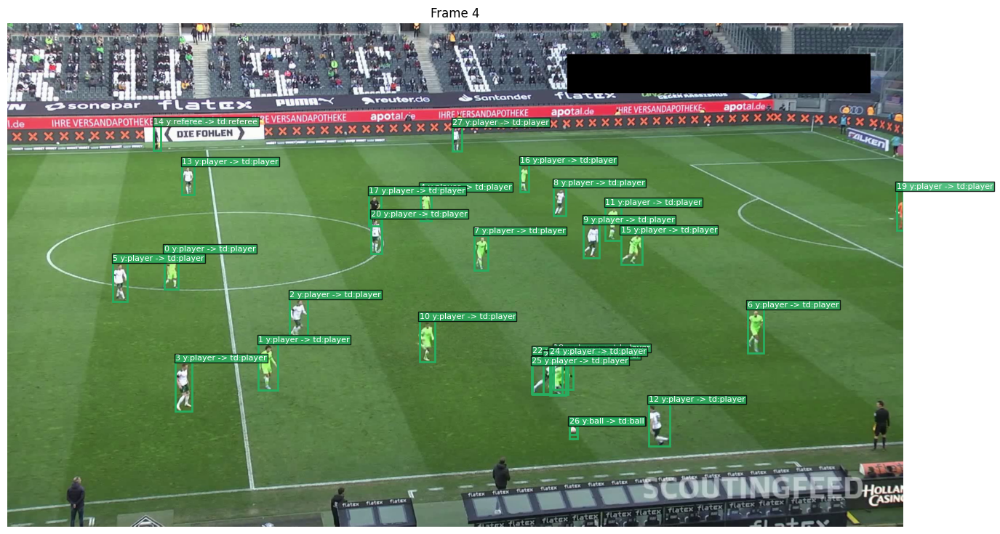

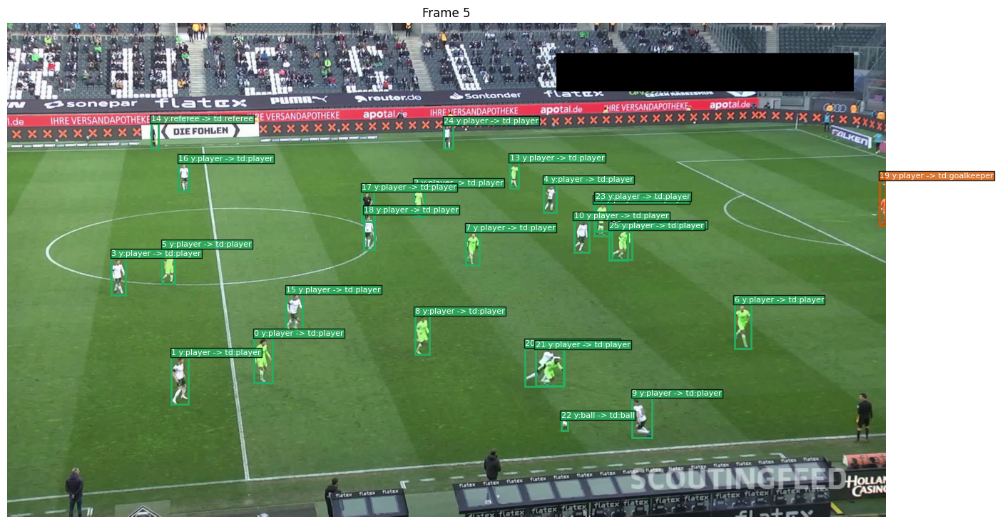

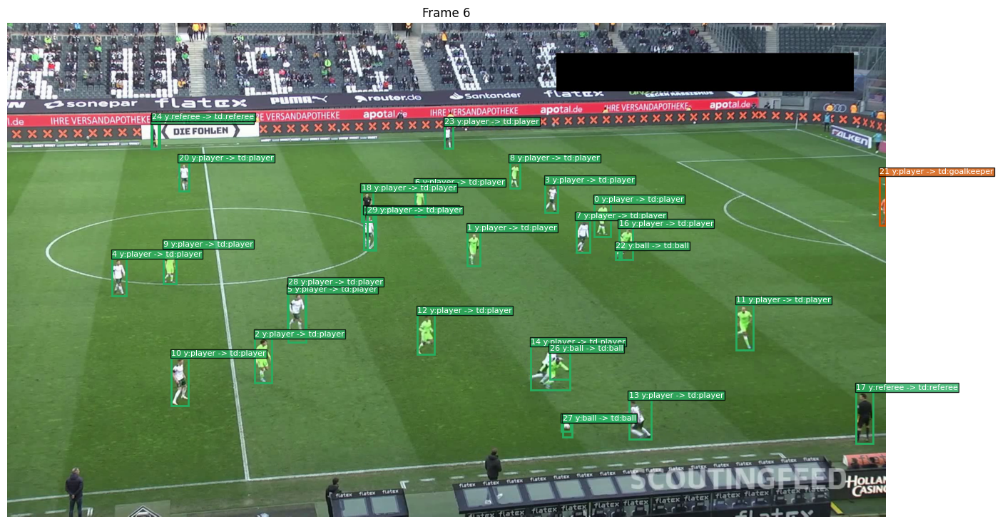

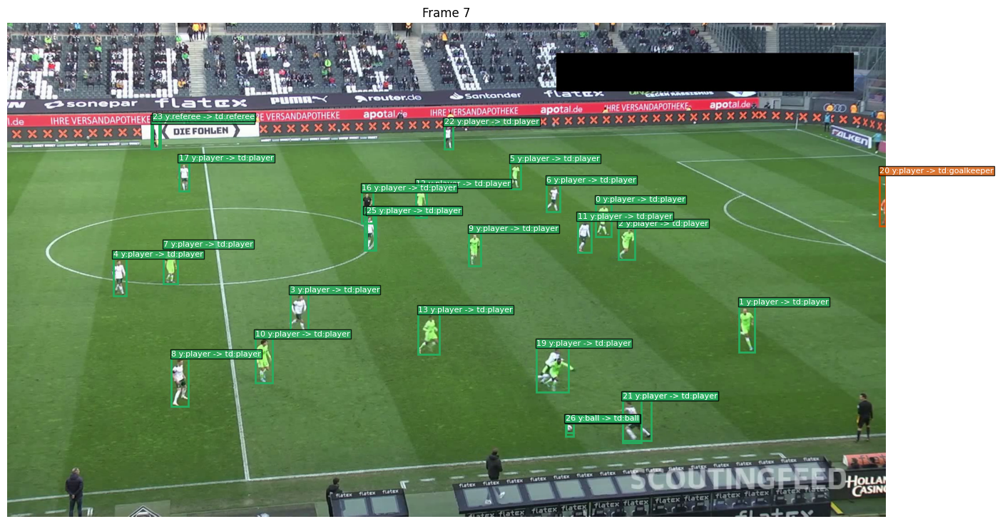

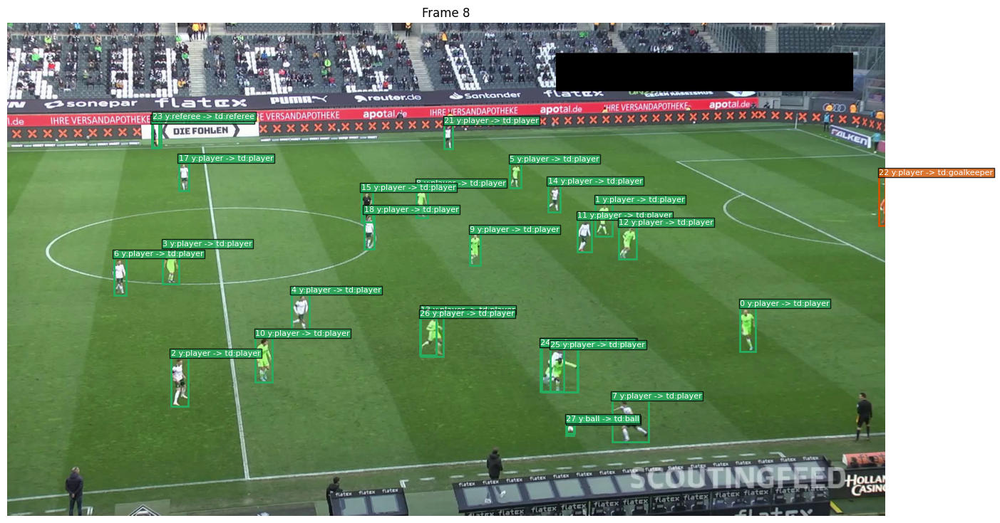

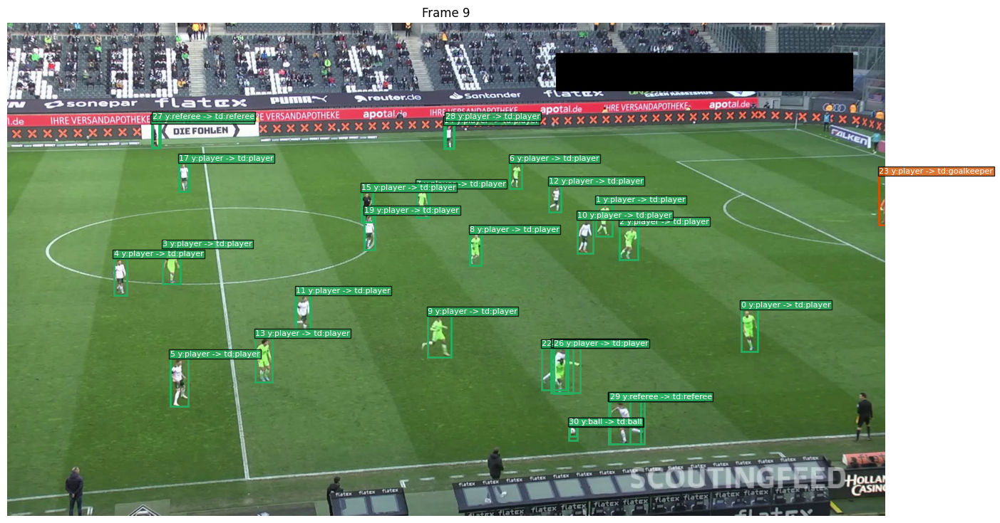

In [12]:
for i in range(0, 10):
    fig = show_frame_overlay(detections_df, '../../data/partidoPrueba/partido_medio.mp4', i)